# Milestone 1: Base Processing

この notebook は、Milestone 1 の前処理を 1 本でまとめて確認するための notebook です。

ここで触る内容:
- 画像の読み込みと表示
- COCO の bbox / mask / keypoint の可視化
- `resize`, `crop`, `pad`, `flip`
- `affine transform`, `perspective transform`
- `color space`, `threshold`, `denoise`, `morphology`
- `normalize`
- Albumentations による image のみ変換
- Albumentations による image + bbox 同期変換
- 簡易データ監査
- PyTorch tensor 化

初心者として一番大事なのは、**画像を変形したら教師ラベルも同じ規則で変形しないといけない**、という点です。

In [114]:
# 標準ライブラリ
import json
from pathlib import Path

# 画像処理と可視化
import albumentations as A
import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
from pycocotools import mask as mask_utils

plt.rcParams["figure.figsize"] = (8, 8)

## 1. データの場所を確認する

ここでは COCO 2017 の `val2017` と annotation を使います。

このセルで理解したいこと:
- notebook は `/workspace` を基準に見ている
- 画像は `/workspace/data/coco/val2017` にある
- keypoint 用 annotation は別ファイルなので、存在チェックが必要

In [115]:
project_root = Path.cwd()
coco_root = project_root / "data" / "coco"
images_dir = coco_root / "val2017"
instances_path = coco_root / "annotations" / "instances_val2017.json"
keypoints_path = coco_root / "annotations" / "person_keypoints_val2017.json"

print(f"project_root: {project_root}")
print(f"images_dir exists: {images_dir.exists()}")
print(f"instances exists: {instances_path.exists()}")
print(f"keypoints exists: {keypoints_path.exists()}")

assert images_dir.exists(), "val2017 が見つかりません。download_coco.py で val を取得してください。"
assert instances_path.exists(), "instances_val2017.json が見つかりません。annotations を取得してください。"

project_root: /workspace
images_dir exists: True
instances exists: True
keypoints exists: True


## 2. annotation を読む

この notebook では instance annotation を基本にし、keypoint は optional で扱います。

このセルで理解したいこと:
- COCO は `images`, `annotations`, `categories` に分かれている
- keypoint annotation は別 JSON のことがある
- まず辞書化しておくと後の処理が楽になる

In [116]:
with instances_path.open("r", encoding="utf-8") as f:
    coco_instances = json.load(f)

coco_keypoints = None
if keypoints_path.exists():
    with keypoints_path.open("r", encoding="utf-8") as f:
        coco_keypoints = json.load(f)

images_by_id = {img["id"]: img for img in coco_instances["images"]}
categories_by_id = {cat["id"]: cat for cat in coco_instances["categories"]}

instance_annotations_by_image = {}
for ann in coco_instances["annotations"]:
    instance_annotations_by_image.setdefault(ann["image_id"], []).append(ann)

keypoint_annotations_by_image = {}
if coco_keypoints is not None:
    for ann in coco_keypoints["annotations"]:
        keypoint_annotations_by_image.setdefault(ann["image_id"], []).append(ann)

print(f"num_images: {len(coco_instances['images'])}")
print(f"num_instance_annotations: {len(coco_instances['annotations'])}")
print(f"num_categories: {len(coco_instances['categories'])}")
print(f"keypoint_annotations_loaded: {coco_keypoints is not None}")

num_images: 5000
num_instance_annotations: 36781
num_categories: 80
keypoint_annotations_loaded: True


In [117]:
print("annotation keys:", instance_annotations_by_image[289343][0].keys())
print("keypoint category_id:", keypoint_annotations_by_image[289343][0]["category_id"])
print("keypoint segmentation:", keypoint_annotations_by_image[289343][0]["segmentation"])
print("keypoint area:", keypoint_annotations_by_image[289343][0]["area"])
print("keypoint bbox:", keypoint_annotations_by_image[289343][0]["bbox"])

annotation keys: dict_keys(['segmentation', 'area', 'iscrowd', 'image_id', 'bbox', 'category_id', 'id'])
keypoint category_id: 1
keypoint segmentation: [[204.01, 306.23, 206.07, 295.92, 216.38, 281.48, 223.6, 269.11, 233.91, 263.95, 229.79, 261.89, 227.72, 251.58, 226.69, 244.36, 229.79, 242.3, 234.94, 235.08, 248.35, 244.36, 246.29, 255.7, 246.29, 261.89, 257.63, 266.01, 260.72, 287.67, 264.85, 305.2, 264.85, 321.7, 259.69, 335.1, 256.6, 350.57, 253.5, 372.22, 254.53, 405.22, 256.6, 412.44, 244.22, 412.44, 240.1, 340.26, 240.1, 327.88, 240.1, 315.99, 231.71, 326.13, 234.15, 361.11, 234.15, 399.93, 229.61, 406.92, 213.87, 402.37, 217.02, 358.31, 217.37, 341.17, 222.26, 326.13, 225.06, 313.89, 230.66, 300.95, 226.81, 283.47, 215.62, 296.76, 211.42, 305.85, 206.53, 307.95]]
keypoint area: 5463.6864
keypoint bbox: [204.01, 235.08, 60.84, 177.36]


### annotation の中の `segmentation` とは何か

`bbox` は物体を囲む長方形です。一方で `segmentation` は、物体が画像のどのピクセル領域にあるかを、物体の形に近い形で表した情報です。

たとえば犬が写っているとき、`bbox` は犬全体を囲む四角ですが、`segmentation` は耳や胴体の輪郭に沿った領域を表します。つまり、`bbox` より細かい位置情報です。

COCO では主に次の 2 形式があります。
- polygon: 輪郭の頂点座標を `[x1, y1, x2, y2, ...]` の形で持つ
- RLE: mask を圧縮して持つ形式で、`iscrowd=1` のときによく出る

`segmentation` があるなら `bbox` は不要に見えるかもしれませんが、実際には両方が使われます。理由は、`bbox` の方が軽く扱いやすく、物体検出や crop、ROI 抽出、小物体確認などで便利だからです。`segmentation` はより細かい形の情報で、instance segmentation や mask 可視化に向いています。つまり、`bbox` は粗い位置情報、`segmentation` は細かい形状情報として役割が少し違います。

この notebook では、`segmentation` を mask に変換して画像へ重ねています。ここで理解したいことは次の通りです。
- `bbox` は四角い範囲、`segmentation` は物体の形に近い範囲
- instance segmentation では `segmentation` が教師ラベルになる
- 前処理によっては bbox だけでなく mask も正しく追従させる必要がある

## 3. 画像を 1 枚選ぶ

bbox と mask を観察しやすいように、annotation が複数ある画像を 1 枚選びます。

このセルで理解したいこと:
- COCO の bbox は `[x, y, width, height]`
- 画像 1 枚に複数 annotation がつく
- 前処理確認では、まず 1 枚固定で観察するのがよい

In [118]:
selected_image_info = None
selected_annotations = None

for image_info in coco_instances["images"]:
    anns = instance_annotations_by_image.get(image_info["id"], [])
    if len(anns) >= 3:
        selected_image_info = image_info
        selected_annotations = anns
        break

assert selected_image_info is not None, "annotation が十分ある画像を見つけられませんでした。"

selected_image_id = selected_image_info["id"]
selected_image_path = images_dir / selected_image_info["file_name"]

print(selected_image_info)
print(f"num_instance_annotations: {len(selected_annotations)}")
print(f"selected_image_path: {selected_image_path}")

{'license': 4, 'file_name': '000000397133.jpg', 'coco_url': 'http://images.cocodataset.org/val2017/000000397133.jpg', 'height': 427, 'width': 640, 'date_captured': '2013-11-14 17:02:52', 'flickr_url': 'http://farm7.staticflickr.com/6116/6255196340_da26cf2c9e_z.jpg', 'id': 397133}
num_instance_annotations: 19
selected_image_path: /workspace/data/coco/val2017/000000397133.jpg


## 4. helper を用意する

この notebook では before / after 比較が主目的なので、先に helper を作ります。

このセルで理解したいこと:
- OpenCV は BGR で読むので、表示前に RGB に直す
- bbox, mask, keypoint を同じ画像上に重ねる helper があると比較しやすい
- COCO の segmentation は polygon または RLE のことがある

In [119]:
def load_image_rgb(image_path: Path) -> np.ndarray:
    image_bgr = cv2.imread(str(image_path))
    assert image_bgr is not None, f"failed to read image: {image_path}"
    return cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)


def draw_bboxes(image: np.ndarray, annotations: list[dict], color=(255, 0, 0), thickness=2) -> np.ndarray:
    canvas = image.copy()
    for ann in annotations:
        x, y, w, h = ann["bbox"]
        x1, y1 = int(round(x)), int(round(y))
        x2, y2 = int(round(x + w)), int(round(y + h))
        cv2.rectangle(canvas, (x1, y1), (x2, y2), color, thickness)
    return canvas


def decode_coco_mask(annotation: dict, height: int, width: int) -> np.ndarray:
    segmentation = annotation.get("segmentation")
    if segmentation is None:
        return np.zeros((height, width), dtype=np.uint8)

    if isinstance(segmentation, list):
        rles = mask_utils.frPyObjects(segmentation, height, width)
        rle = mask_utils.merge(rles)
    elif isinstance(segmentation, dict) and isinstance(segmentation.get("counts"), list):
        rle = mask_utils.frPyObjects(segmentation, height, width)
    else:
        rle = segmentation

    mask = mask_utils.decode(rle)
    if mask.ndim == 3:
        mask = np.any(mask, axis=2).astype(np.uint8)
    return mask.astype(np.uint8)


def overlay_mask(image: np.ndarray, mask: np.ndarray, color=(0, 255, 0), alpha=0.35) -> np.ndarray:
    canvas = image.copy().astype(np.float32)
    color_array = np.array(color, dtype=np.float32)
    canvas[mask > 0] = (1 - alpha) * canvas[mask > 0] + alpha * color_array
    return np.clip(canvas, 0, 255).astype(np.uint8)


def draw_keypoints(image: np.ndarray, annotation: dict, color=(255, 255, 0), radius=4) -> np.ndarray:
    canvas = image.copy()
    keypoints = annotation.get("keypoints", [])
    for i in range(0, len(keypoints), 3):
        x, y, v = keypoints[i:i+3]
        if v > 0:
            cv2.circle(canvas, (int(round(x)), int(round(y))), radius, color, -1)
    return canvas


def show_images(image_map: dict[str, np.ndarray], cols: int = 2) -> None:
    items = list(image_map.items())
    rows = int(np.ceil(len(items) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(7 * cols, 6 * rows))
    axes = np.array(axes).reshape(-1)

    for ax, (title, image) in zip(axes, items):
        ax.imshow(image)
        ax.set_title(title)
        ax.axis("off")

    for ax in axes[len(items):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

## 5. 元画像, bbox, mask を確認する

ここが基準です。前処理後に何がどう変わったかは、常にこの見え方と比べます。

理解ポイント:
- bbox は長方形として見える
- mask は物体の形まで持っている
- bbox と mask は同じ annotation でも情報量が違う

original image shape (H, W, C): (427, 640, 3)


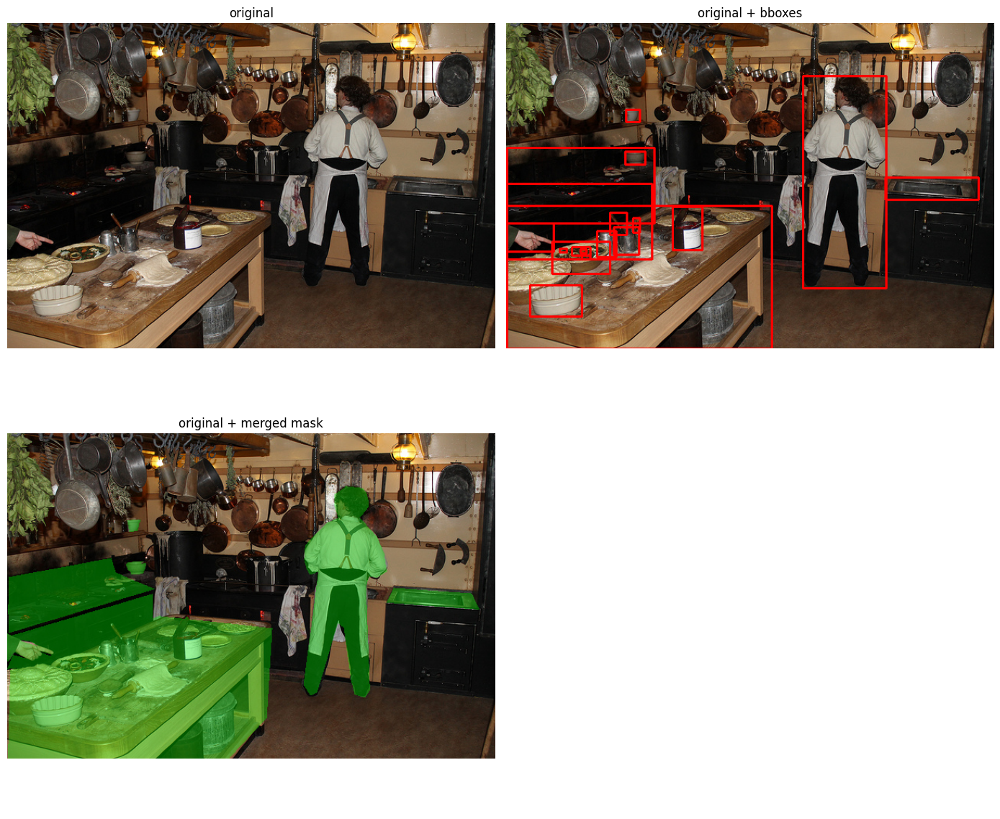

In [120]:
image = load_image_rgb(selected_image_path)
original_height, original_width = image.shape[:2]

image_with_bboxes = draw_bboxes(image, selected_annotations)

merged_mask = np.zeros((original_height, original_width), dtype=np.uint8)
for ann in selected_annotations:
    merged_mask = np.maximum(merged_mask, decode_coco_mask(ann, original_height, original_width))

image_with_mask = overlay_mask(image, merged_mask)

print(f"original image shape (H, W, C): {image.shape}")
show_images({
    "original": image,
    "original + bboxes": image_with_bboxes,
    "original + merged mask": image_with_mask,
}, cols=2)

## 6. resize

目的:
- モデルへ入れる画像サイズをそろえる
- batch 化しやすくする
- 学習時のメモリ使用量をある程度そろえる

どうやって処理しているか:
- 画像は `cv2.resize` で新しい幅・高さへ変換する
- bbox は `x`, `w` に横方向の倍率をかける
- bbox は `y`, `h` に縦方向の倍率をかける

理解ポイント:
- 横と縦で倍率が違うなら bbox も別倍率で伸縮する
- 画像だけ resize して bbox を変えないとラベルが壊れる

scale_x: 1.000, scale_y: 1.499


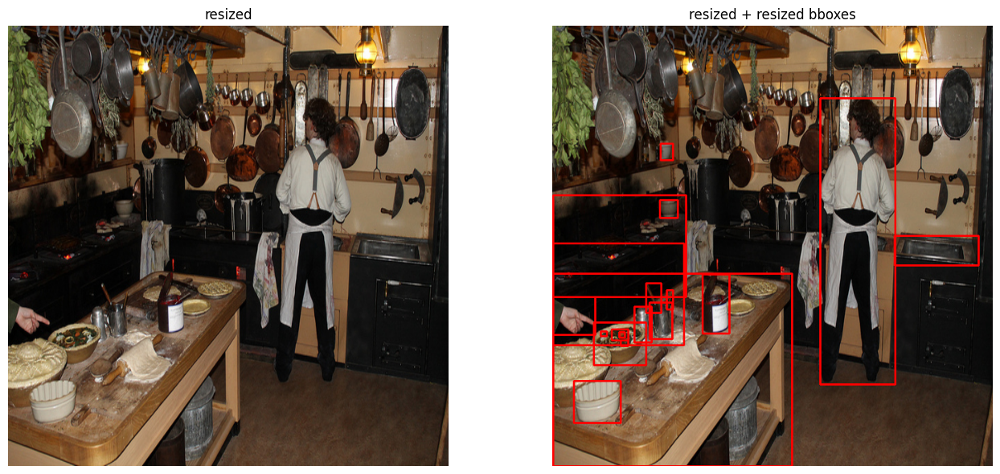

In [121]:
target_width = 640
target_height = 640
scale_x = target_width / original_width
scale_y = target_height / original_height

resized_image = cv2.resize(image, (target_width, target_height), interpolation=cv2.INTER_LINEAR)

resized_annotations = []
for ann in selected_annotations:
    x, y, w, h = ann["bbox"]
    resized_annotations.append({**ann, "bbox": [x * scale_x, y * scale_y, w * scale_x, h * scale_y]})

resized_image_with_bboxes = draw_bboxes(resized_image, resized_annotations)
print(f"scale_x: {scale_x:.3f}, scale_y: {scale_y:.3f}")
show_images({
    "resized": resized_image,
    "resized + resized bboxes": resized_image_with_bboxes,
})

## 7. center crop

目的:
- 画像の中央だけを使って不要な周辺情報を減らす
- patch 的な発想の入口を理解する

どうやって処理しているか:
- crop の左上座標を決める
- bbox の原点もそのぶん左上へずらす
- crop の外にはみ出した部分は clip する
- 幅や高さがほぼ消えた bbox は捨てる

理解ポイント:
- crop は原点が変わる
- resize より bbox 追従が難しい

annotations before crop: 19
annotations after crop: 18


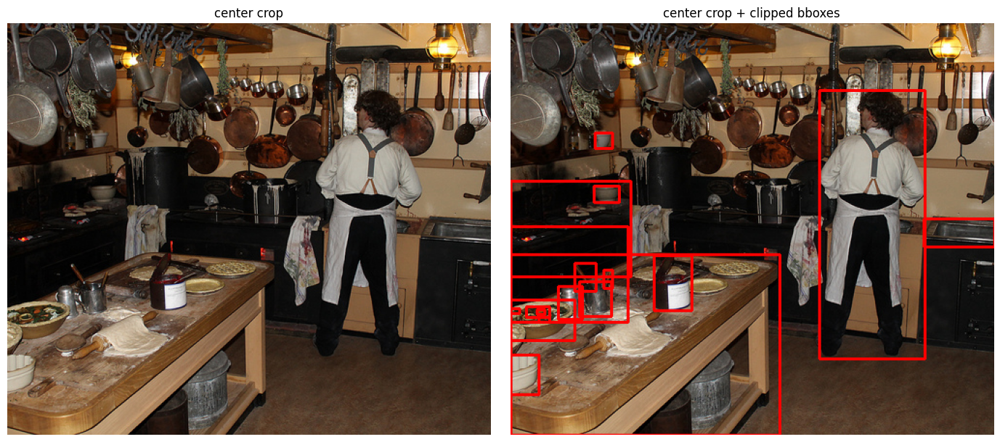

In [122]:
crop_width = min(500, original_width)
crop_height = min(500, original_height)
crop_x0 = max((original_width - crop_width) // 2, 0)
crop_y0 = max((original_height - crop_height) // 2, 0)

cropped_image = image[crop_y0:crop_y0 + crop_height, crop_x0:crop_x0 + crop_width]

cropped_annotations = []
for ann in selected_annotations:
    x, y, w, h = ann["bbox"]
    x1 = np.clip(x - crop_x0, 0, crop_width)
    y1 = np.clip(y - crop_y0, 0, crop_height)
    x2 = np.clip(x + w - crop_x0, 0, crop_width)
    y2 = np.clip(y + h - crop_y0, 0, crop_height)
    new_w = x2 - x1
    new_h = y2 - y1
    if new_w >= 1 and new_h >= 1:
        cropped_annotations.append({**ann, "bbox": [float(x1), float(y1), float(new_w), float(new_h)]})

cropped_image_with_bboxes = draw_bboxes(cropped_image, cropped_annotations)
print(f"annotations before crop: {len(selected_annotations)}")
print(f"annotations after crop: {len(cropped_annotations)}")
show_images({
    "center crop": cropped_image,
    "center crop + clipped bboxes": cropped_image_with_bboxes,
})

## 8. pad to square

目的:
- 画像を引き伸ばさずに入力サイズだけ合わせる
- aspect ratio を保ったままサイズをそろえる

どうやって処理しているか:
- 上下左右へ余白を追加する
- bbox は余白ぶんだけ平行移動する

理解ポイント:
- resize と違って大きさは変わらず、位置だけずれる

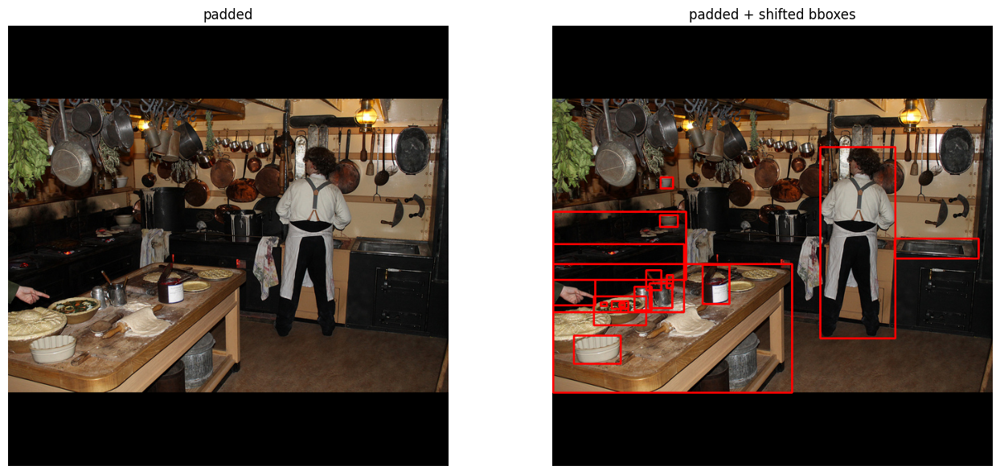

In [123]:
pad_target = max(original_height, original_width)
pad_top = (pad_target - original_height) // 2
pad_bottom = pad_target - original_height - pad_top
pad_left = (pad_target - original_width) // 2
pad_right = pad_target - original_width - pad_left

padded_image = cv2.copyMakeBorder(
    image,
    top=pad_top,
    bottom=pad_bottom,
    left=pad_left,
    right=pad_right,
    borderType=cv2.BORDER_CONSTANT,
    value=(0, 0, 0),
)

padded_annotations = []
for ann in selected_annotations:
    x, y, w, h = ann["bbox"]
    padded_annotations.append({**ann, "bbox": [x + pad_left, y + pad_top, w, h]})

padded_image_with_bboxes = draw_bboxes(padded_image, padded_annotations)
show_images({
    "padded": padded_image,
    "padded + shifted bboxes": padded_image_with_bboxes,
})

## 9. horizontal flip

目的:
- augmentation の代表例を理解する
- bbox が倍率変換ではなく鏡映変換になることを理解する

どうやって処理しているか:
- 画像を左右反転する
- bbox の左端 `x` を `image_width - x - w` に変える

理解ポイント:
- flip は座標の鏡映変換
- keypoint では左右ラベル交換も必要になる

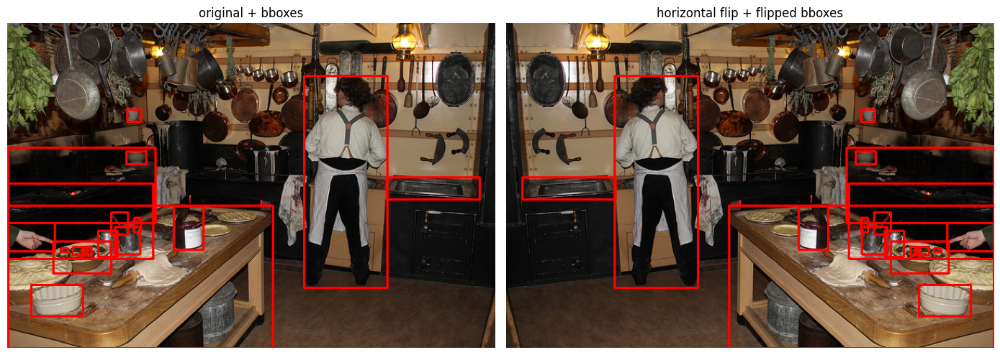

In [124]:
flipped_image = cv2.flip(image, 1)
flipped_annotations = []
for ann in selected_annotations:
    x, y, w, h = ann["bbox"]
    flipped_annotations.append({**ann, "bbox": [original_width - x - w, y, w, h]})

flipped_image_with_bboxes = draw_bboxes(flipped_image, flipped_annotations)
show_images({
    "original + bboxes": image_with_bboxes,
    "horizontal flip + flipped bboxes": flipped_image_with_bboxes,
})

## 10. affine transform

目的:
- 回転, 平行移動, 拡大縮小を 1 つの枠組みで理解する
- 画像変形の自由度が増えるとラベル追従が難しくなることを理解する

どうやって処理しているか:
- `cv2.getRotationMatrix2D` で affine 行列を作る
- `cv2.warpAffine` で画像へ適用する

理解ポイント:
- affine は bbox を厳密に追うと少し複雑
- まずは画像の変わり方を理解するのが大事

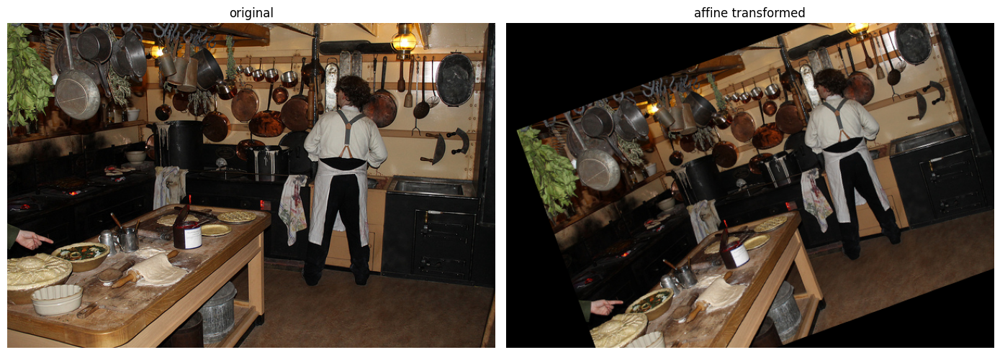

In [125]:
center = (original_width / 2, original_height / 2)
affine_matrix = cv2.getRotationMatrix2D(center=center, angle=20, scale=0.9)
affine_matrix[0, 2] += 30
affine_matrix[1, 2] += 10

affine_image = cv2.warpAffine(
    image,
    affine_matrix,
    (original_width, original_height),
    flags=cv2.INTER_LINEAR,
    borderMode=cv2.BORDER_CONSTANT,
    borderValue=(0, 0, 0),
)

show_images({
    "original": image,
    "affine transformed": affine_image,
})

## 11. perspective transform

目的:
- 斜めから見た画像や射影ゆがみを扱う基礎を理解する
- OCR や document AI で重要になる発想を先に知る

どうやって処理しているか:
- 4 点の対応から perspective 行列を作る
- `cv2.warpPerspective` で画像へ適用する

理解ポイント:
- perspective は affine より強い変形
- bbox より polygon や mask の方が扱いやすい場面がある

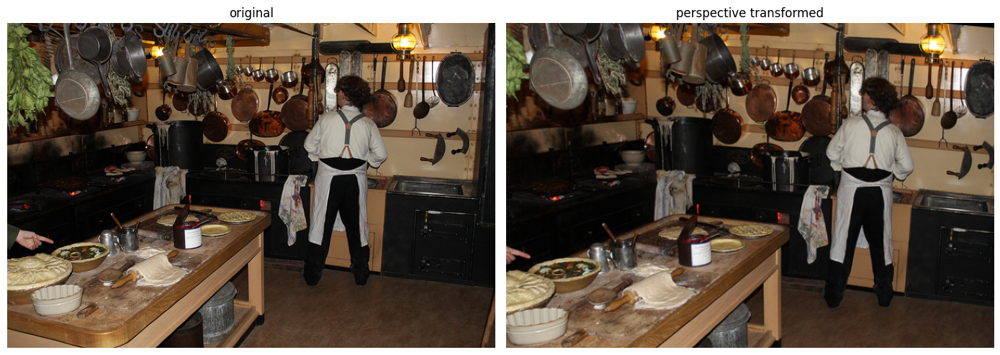

In [126]:
src_points = np.float32([
    [40, 40],
    [original_width - 40, 30],
    [50, original_height - 40],
    [original_width - 30, original_height - 30],
])
dst_points = np.float32([
    [0, 0],
    [original_width - 1, 40],
    [20, original_height - 1],
    [original_width - 1, original_height - 1],
])

perspective_matrix = cv2.getPerspectiveTransform(src_points, dst_points)
perspective_image = cv2.warpPerspective(
    image,
    perspective_matrix,
    (original_width, original_height),
    flags=cv2.INTER_LINEAR,
    borderMode=cv2.BORDER_CONSTANT,
    borderValue=(0, 0, 0),
)

show_images({
    "original": image,
    "perspective transformed": perspective_image,
})

## 12. color space conversion

目的:
- RGB 以外の見え方を理解する
- threshold や document 系処理の前段として、グレースケールや HSV を知る

どうやって処理しているか:
- `cv2.cvtColor` で色空間を変換する

理解ポイント:
- 前処理は必ずしも RGB のままではない
- 処理の目的に応じて色空間を変える

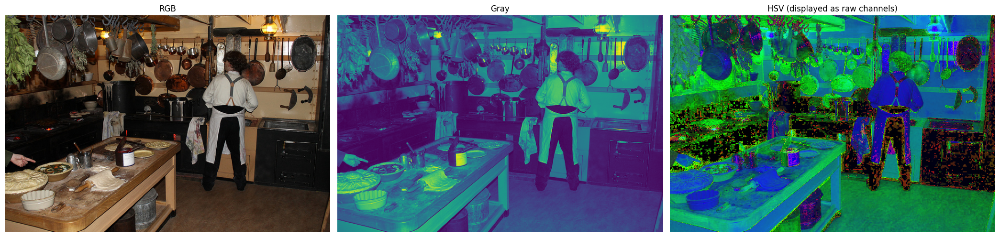

In [127]:
image_bgr = cv2.imread(str(selected_image_path))
image_gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
image_hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)

show_images({
    "RGB": image,
    "Gray": image_gray,
    "HSV (displayed as raw channels)": image_hsv,
}, cols=3)

## 13. threshold

目的:
- 明るさを基準に白黒へ分ける処理を理解する
- OCR や簡単な領域抽出の前段として使えることを知る

どうやって処理しているか:
- グレースケール画像に対して閾値を設定する
- `cv2.threshold` で二値化する

理解ポイント:
- threshold は見た目よりも情報の切り分けが目的
- 閾値しだいで残る情報が大きく変わる

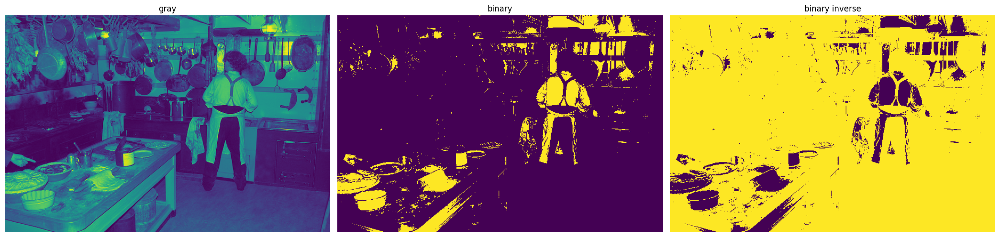

In [128]:
_, binary_image = cv2.threshold(image_gray, 140, 255, cv2.THRESH_BINARY)
_, binary_inv_image = cv2.threshold(image_gray, 140, 255, cv2.THRESH_BINARY_INV)

show_images({
    "gray": image_gray,
    "binary": binary_image,
    "binary inverse": binary_inv_image,
}, cols=3)

## 14. denoise

目的:
- ノイズを減らす前処理を理解する
- blur と detail のトレードオフを知る

どうやって処理しているか:
- `GaussianBlur` と `medianBlur` を比べる

理解ポイント:
- ノイズ除去は便利だが、細部も失いやすい
- データや目的に応じて手法を選ぶ

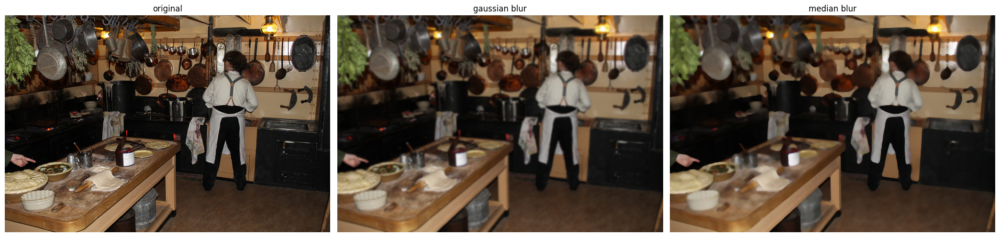

In [129]:
gaussian_blur = cv2.GaussianBlur(image, (7, 7), 0)
median_blur = cv2.medianBlur(image, 7)

show_images({
    "original": image,
    "gaussian blur": gaussian_blur,
    "median blur": median_blur,
}, cols=3)

## 15. morphology

目的:
- 二値画像の小さな穴やノイズを整理する
- OCR や領域抽出の前段として使う発想を理解する

どうやって処理しているか:
- `erode`, `dilate`, `opening`, `closing` を試す
- 今回は threshold 後の画像を使う

理解ポイント:
- morphology は白黒画像の形を変える処理
- ノイズ除去と細部消失のバランスがある

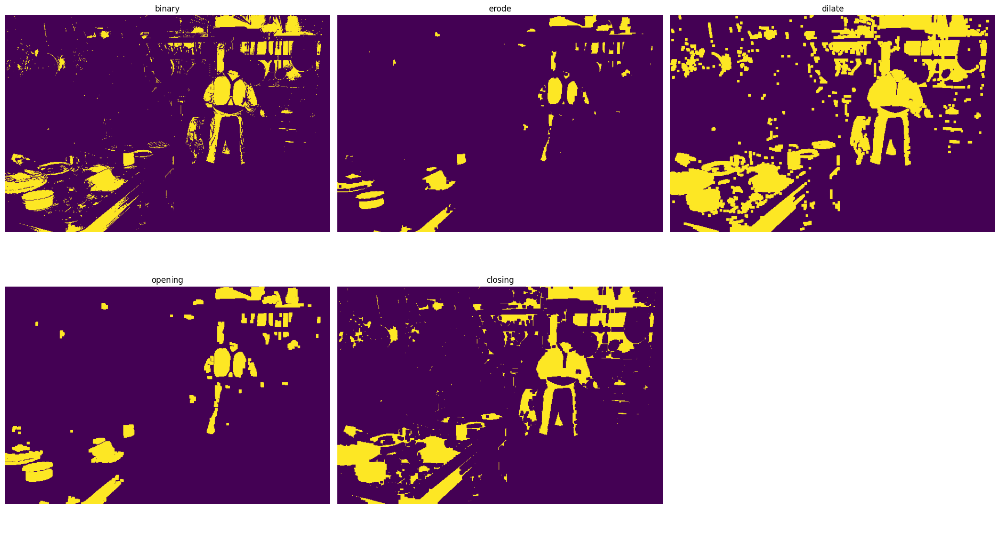

In [130]:
kernel = np.ones((5, 5), dtype=np.uint8)
eroded = cv2.erode(binary_image, kernel, iterations=1)
dilated = cv2.dilate(binary_image, kernel, iterations=1)
opened = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
closed = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)

show_images({
    "binary": binary_image,
    "erode": eroded,
    "dilate": dilated,
    "opening": opened,
    "closing": closed,
}, cols=3)

## 16. normalize

目的:
- モデルへ入る入力値の分布を安定させる
- 事前学習済みモデルが想定する入力スケールへ合わせる

どうやって処理しているか:
- 0〜255 を 0〜1 に変える
- `mean` を引いて `std` で割る

理解ポイント:
- normalize は見た目を良くする処理ではない
- normalize 後の画像をそのまま表示すると色が不自然でも正常

before normalize: min=0.000, max=1.000
after normalize: min=-2.118, max=2.640


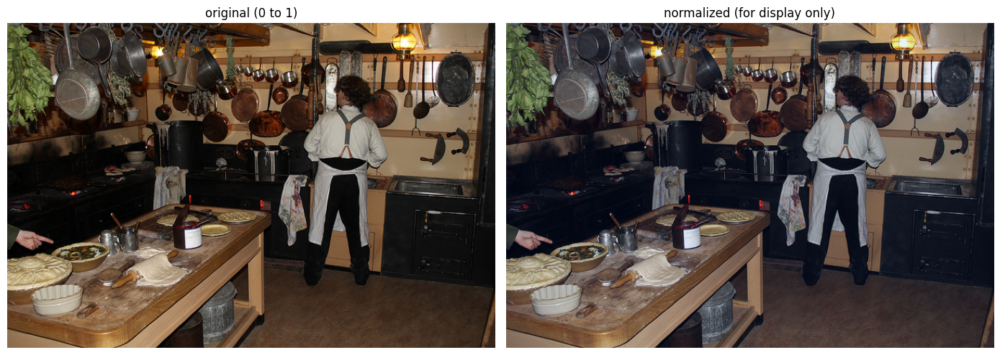

In [131]:
image_float = image.astype(np.float32) / 255.0
mean = np.array([0.485, 0.456, 0.406], dtype=np.float32)
std = np.array([0.229, 0.224, 0.225], dtype=np.float32)
normalized_image = (image_float - mean) / std
normalized_for_display = np.clip(
    (normalized_image - normalized_image.min()) / (normalized_image.max() - normalized_image.min()),
    0,
    1,
)

print(f"before normalize: min={image_float.min():.3f}, max={image_float.max():.3f}")
print(f"after normalize: min={normalized_image.min():.3f}, max={normalized_image.max():.3f}")
show_images({
    "original (0 to 1)": image_float,
    "normalized (for display only)": normalized_for_display,
})

## 17. Albumentations: image のみ

目的:
- 前処理ライブラリを使って augmentation をまとめて書く感覚をつかむ
- OpenCV 手書き実装との違いを理解する

どうやって処理しているか:
- Albumentations の transform を compose する
- まずは image のみ変換する

理解ポイント:
- Albumentations は augmentation 比較に向いている
- image だけ変換する場合は比較的簡単

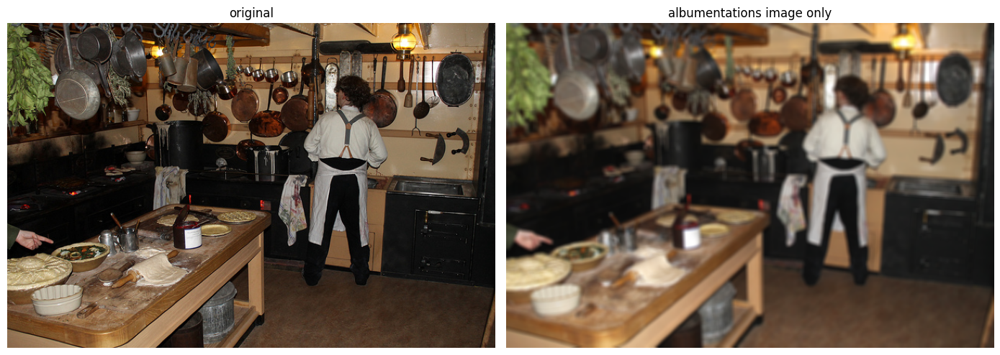

In [132]:
image_only_transform = A.Compose([
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=1.0),
    A.GaussianBlur(blur_limit=(3, 7), p=1.0),
])

transformed_image_only = image_only_transform(image=image)["image"]
show_images({
    "original": image,
    "albumentations image only": transformed_image_only,
})

## 18. Albumentations: image + bbox 同期変換

目的:
- 画像と bbox を同時に安全に変換する方法を理解する
- 手書き実装では面倒な座標変換をライブラリに任せる感覚をつかむ

どうやって処理しているか:
- bbox を COCO 形式のまま Albumentations へ渡す
- transform 後の bbox を返してもらう

理解ポイント:
- augmentation は image だけでは不十分
- bbox を壊さず同期変換できることが重要

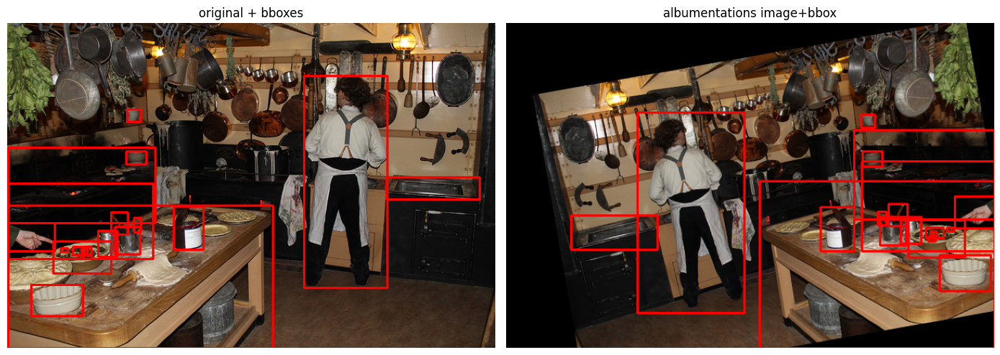

In [133]:
bbox_transform = A.Compose(
    [
        A.HorizontalFlip(p=1.0),
        A.Affine(scale=0.9, translate_percent={"x": 0.05, "y": 0.05}, rotate=10, p=1.0),
    ],
    bbox_params=A.BboxParams(format="coco", label_fields=["bbox_labels", "bbox_indices"]),
)

input_bboxes = [ann["bbox"] for ann in selected_annotations]
bbox_labels = [categories_by_id[ann["category_id"]]["name"] for ann in selected_annotations]
bbox_indices = list(range(len(selected_annotations)))

bbox_result = bbox_transform(image=image, bboxes=input_bboxes, bbox_labels=bbox_labels, bbox_indices=bbox_indices)
bbox_sync_image = bbox_result["image"]
bbox_sync_annotations = []
for bbox, ann_index in zip(bbox_result["bboxes"], bbox_result["bbox_indices"]):
    ann_index = int(ann_index)
    ann = selected_annotations[ann_index]
    bbox_sync_annotations.append({**ann, "bbox": list(bbox)})

bbox_sync_image_with_bboxes = draw_bboxes(bbox_sync_image, bbox_sync_annotations)
show_images({
    "original + bboxes": image_with_bboxes,
    "albumentations image+bbox": bbox_sync_image_with_bboxes,
})

## 19. keypoint 可視化

目的:
- bbox 以外の教師ラベルもあると理解する
- keypoint は点の集合なので bbox と違う扱いが必要だと知る

どうやって処理しているか:
- `person_keypoints_val2017.json` があれば person annotation を 1 枚描く
- なければこのセクションは skip する

理解ポイント:
- COCO では keypoint は person 中心
- flip 時には左右ラベル交換も必要になる

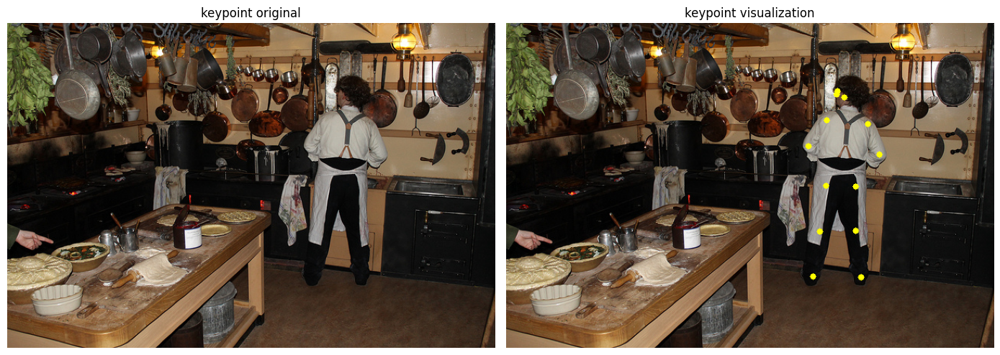

In [134]:
if coco_keypoints is None:
    print("person_keypoints_val2017.json がないので keypoint 可視化は skip します。")
else:
    keypoint_image_info = None
    keypoint_annotation = None
    for image_info in coco_keypoints["images"]:
        anns = keypoint_annotations_by_image.get(image_info["id"], [])
        visible_anns = [ann for ann in anns if ann.get("num_keypoints", 0) >= 5]
        if visible_anns:
            keypoint_image_info = image_info
            keypoint_annotation = visible_anns[0]
            break

    if keypoint_image_info is None:
        print("可視化に使える keypoint annotation を見つけられませんでした。")
    else:
        keypoint_image = load_image_rgb(images_dir / keypoint_image_info["file_name"])
        keypoint_image_with_points = draw_keypoints(keypoint_image, keypoint_annotation)
        show_images({
            "keypoint original": keypoint_image,
            "keypoint visualization": keypoint_image_with_points,
        })

## 20. 簡単なデータ監査をやってみる

目的:
- 学習前にデータの偏りや異常をざっくり把握する
- 画像サイズや annotation 数を見る習慣をつける

どうやって処理しているか:
- `images` と `annotations` から基本統計を集計する
- 画像ごとの bbox 数分布を見る

理解ポイント:
- 前処理の前にデータそのものを見ることが重要
- 画像サイズや bbox 数の偏りは学習に影響する

In [135]:
image_widths = np.array([img["width"] for img in coco_instances["images"]])
image_heights = np.array([img["height"] for img in coco_instances["images"]])
bbox_counts = np.array([len(instance_annotations_by_image.get(img["id"], [])) for img in coco_instances["images"]])

print(f"num_images: {len(coco_instances['images'])}")
print(f"num_annotations: {len(coco_instances['annotations'])}")
print(f"width  min / max / mean : {image_widths.min()} / {image_widths.max()} / {image_widths.mean():.1f}")
print(f"height min / max / mean : {image_heights.min()} / {image_heights.max()} / {image_heights.mean():.1f}")
print(f"bbox count per image min / max / mean : {bbox_counts.min()} / {bbox_counts.max()} / {bbox_counts.mean():.2f}")

num_images: 5000
num_annotations: 36781
width  min / max / mean : 200 / 640 / 573.8
height min / max / mean : 145 / 640 / 483.5
bbox count per image min / max / mean : 0 / 63 / 7.36


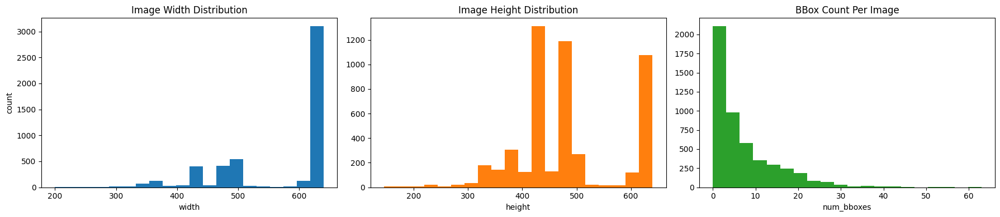

In [136]:
fig, axes = plt.subplots(1, 3, figsize=(18, 4))
axes[0].hist(image_widths, bins=20, color="tab:blue")
axes[0].set_title("Image Width Distribution")
axes[0].set_xlabel("width")
axes[0].set_ylabel("count")

axes[1].hist(image_heights, bins=20, color="tab:orange")
axes[1].set_title("Image Height Distribution")
axes[1].set_xlabel("height")

axes[2].hist(bbox_counts, bins=20, color="tab:green")
axes[2].set_title("BBox Count Per Image")
axes[2].set_xlabel("num_bboxes")

plt.tight_layout()
plt.show()

## 21. PyTorch に入る直前の形を作る

目的:
- notebook の画像処理が PyTorch 入力へつながると理解する
- `HWC` と `CHW` の違いに慣れる

どうやって処理しているか:
- 画像を `float32` の 0〜1 にする
- `HWC` から `CHW` に並べ替える
- `torch.tensor` に変える

理解ポイント:
- OpenCV / matplotlib は基本 `HWC`
- PyTorch は基本 `CHW`

In [137]:
torch_input = torch.from_numpy(image.astype(np.float32) / 255.0).permute(2, 0, 1)
print(f"numpy image shape: {image.shape}")
print(f"torch input shape: {tuple(torch_input.shape)}")
print(f"torch dtype: {torch_input.dtype}")
print(f"value range: {torch_input.min().item():.3f} to {torch_input.max().item():.3f}")

numpy image shape: (427, 640, 3)
torch input shape: (3, 427, 640)
torch dtype: torch.float32
value range: 0.000 to 1.000


## 22. この notebook で理解したいまとめ

- `resize`: bbox も倍率で変換する
- `crop`: 原点が変わり、はみ出し clip が必要
- `pad`: bbox は位置だけ平行移動する
- `flip`: bbox は鏡映変換する
- `affine`, `perspective`: 画像変形の自由度が高くなるほどラベル追従は難しい
- `threshold`, `denoise`, `morphology`: 画像内容を整理する前処理
- `normalize`: モデル入力用の数値変換
- Albumentations: image とラベルの同期変換を安全に書ける
- COCO では bbox, mask, keypoint の入口まで確認できる